In [ ]:
#!pip install tensorboard
#!pip install keras-tuner -q

In [2]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

In [47]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

In [5]:
!nvidia-smi

Thu Oct 23 08:43:14 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0  On |                  N/A |
|  0%   42C    P8             11W /  200W |    1314MiB /  12282MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [48]:
# Текущая директория + путь к датасету

import os
HOME = os.getcwd()
print(HOME)
print('-----------------------')
# Пути
IMAGE_PATH = "/home/oleg/projects/datasets/construction"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
#dataset_path = "./construction"
#IMAGE_PATH = dataset_path
os.listdir(IMAGE_PATH)

/home/oleg/projects/ML
-----------------------


['mining_loader',
 'bulldozer',
 'ice_rink',
 'dump_truck',
 'excavator',
 'person',
 'car',
 'truck_crane']

In [ ]:
# как скачать датасет с Kaggle
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

In [ ]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

In [ ]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [49]:
# МЕТКИ INTEGER

# САМЫЙ ПРОСТОЙ ВАРИАНТ - integer labels

import tensorflow as tf
#from tensorflow.keras.applications.resnet50 import preprocess_input        # импорт для resnet50
from tensorflow.keras.applications.efficientnet import preprocess_input     # импорт для efficientnet
import numpy as np
import matplotlib.pyplot as plt

height, width = 224, 224
batch_size=16

print("🔄 СОЗДАЕМ ПАЙПЛАЙН...")

# Загрузка данных (хорошо!)
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

validation_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='validation', 
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

# Проверка формата (хорошо!)
images, labels = next(iter(train_data_raw))
print(f"Labels shape: {labels.shape}")  # (32,) - integer
print(f"Labels: {labels.numpy()[:15]}")  # [0, 1, 0, 2, 1]

class_names = train_data_raw.class_names
num_classes = len(class_names)
print(f"🏷️ Классы: {class_names}")

# Аугментация (хорошо!)
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

#print("🔧 СОЗДАЕМ ПРОСТОЙ ПАЙПЛАЙН...")

'''
# Проепроцессин для RESNET
def preprocess_and_augment(image, label, training=False):
    """Preprocess + аугментация если training=True"""
    image = preprocess_input(tf.cast(image, tf.float32))
    if training:
        image = data_augmentation(image, training=True)
    return image, label
'''

# Проепроцессин для EfficientNet
def preprocess_and_augment(image, label, training=False):
    """Правильный препроцессинг для EfficientNet"""
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)  # ✅ Должен нормализовать в [0, 1] или [-1, 1]
    if training:
        image = data_augmentation(image, training=True)
    return image, label

# Финальные datasets за 2 шага
train_data = (
    train_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=True),
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

validation_data = (
    validation_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=False), 
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

# Убедимся что препроцессинг работает правильно
print("🔍 Проверка препроцессинга:")
for images, labels in train_data.take(1):
    print(f"Shape: {images.shape}")
    print(f"Data range: {tf.reduce_min(images):.3f} to {tf.reduce_max(images):.3f}")
    print(f"Mean: {tf.reduce_mean(images):.3f}")
    break

print("✅ Пайплайн создан!")

🔄 СОЗДАЕМ ПАЙПЛАЙН...
Found 4990 files belonging to 8 classes.
Using 3992 files for training.
Found 4990 files belonging to 8 classes.
Using 998 files for validation.
Labels shape: (16,)
Labels: [0 1 1 5 2 4 2 6 5 0 1 3 2 1 1]
🏷️ Классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
🔍 Проверка препроцессинга:
Shape: (16, 224, 224, 3)
Data range: 0.000 to 255.000
Mean: 115.302
✅ Пайплайн создан!


In [15]:
# Посмотреть размер одного батча
for images, labels in train_data.take(1):
    print("Форма одного батча:", images.shape)
    print("Размер одного батча в MiB:",
          tf.size(images).numpy() * 4 / (1024 ** 2), "MiB")

I0000 00:00:1761151944.400710  203172 service.cc:152] XLA service 0x724dd00a81d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761151944.400929  203172 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070, Compute Capability 8.9
I0000 00:00:1761151944.509472  203181 cuda_dnn.cc:529] Loaded cuDNN version 91400
I0000 00:00:1761151944.586475  203181 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Форма одного батча: (16, 224, 224, 3)
Размер одного батча в MiB: 9.1875 MiB


2025-10-22 19:52:24.863144: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [10]:
# Проверим реальное состояние данных
images, labels = next(iter(train_data))
print("🔍 Реальные данные:")
print(f"  Диапазон изображений: {images.numpy().min():.3f} - {images.numpy().max():.3f}")
print(f"  Тип данных: {images.dtype}")
print(f"  Форма labels: {labels.shape}")
print(f"  Пример labels: {labels.numpy()[0]}")

🔍 Реальные данные:
  Диапазон изображений: -123.680 - 151.061
  Тип данных: <dtype: 'float32'>
  Форма labels: (16,)
  Пример labels: 7


2025-10-23 08:59:24.962081: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 2158462432562108411
2025-10-23 08:59:24.962241: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 14113163631143452738
2025-10-23 08:59:24.962380: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 2910371953020678924
2025-10-23 08:59:24.962428: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 1231448126002095190
2025-10-23 08:59:24.962453: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 6672985272663005834
2025-10-23 08:59:24.962470: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 14176797599164845320


🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):
📊 Распределение в тренировочных данных:


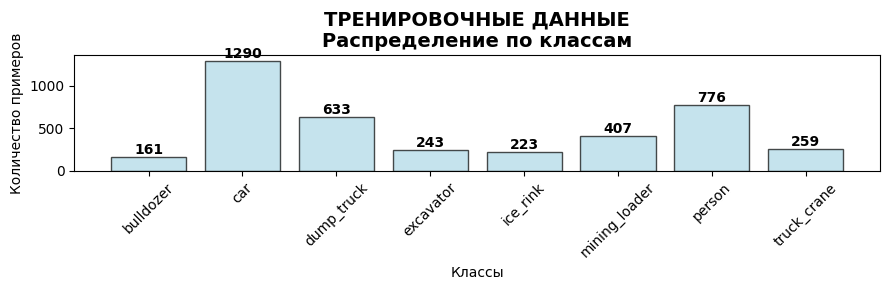

📊 Распределение в валидационных данных:


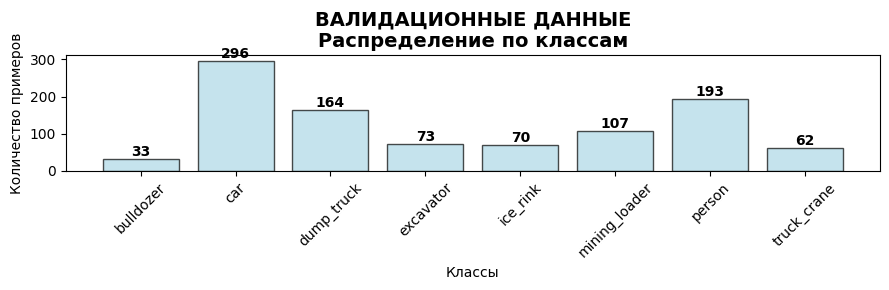


🖼️ По одному примеру на класс (тренировка):


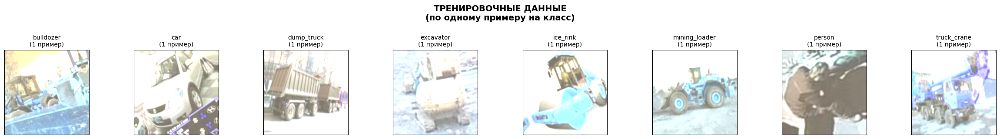


🖼️ По одному примеру на класс (валидация):


2025-10-23 09:29:45.545356: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


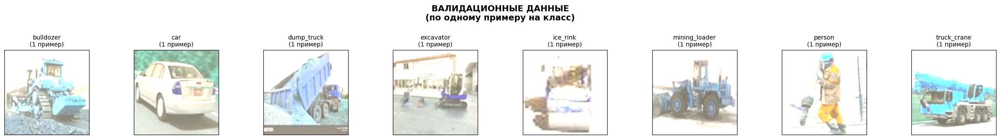

In [28]:
def visualize_single_example_per_class(dataset, class_names, title=""):
    """
    Визуализация по одному примеру для каждого класса
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset.take(10):  # Берем несколько батчей
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Создаем сетку для визуализации
    cols = len(class_names)
    fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3))
    
    if cols == 1:
        axes = [axes]
    
    fig.suptitle(f'{title}\n(по одному примеру на класс)', fontsize=14, fontweight='bold', y=1.05)
    
    for class_idx, class_name in enumerate(class_names):
        ax = axes[class_idx]
        
        # Находим первый пример этого класса
        class_mask = all_labels == class_idx
        class_examples = all_images[class_mask]
        
        if len(class_examples) > 0:
            # Берем первый пример класса
            image = class_examples[0].copy()
            
            # Восстанавливаем оригинальные цвета
            image[..., 0] += 103.939  # B
            image[..., 1] += 116.779  # G
            image[..., 2] += 123.68   # R
            image = np.clip(image, 0, 255).astype('uint8')
            image = image[..., ::-1]  # BGR → RGB
            
            ax.imshow(image)
            ax.set_title(f'{class_name}\n(1 пример)', fontsize=10)
        else:
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title(f'{class_name}\n(нет примеров)', fontsize=10)
            ax.text(0.5, 0.5, 'Нет примеров', 
                   ha='center', va='center', 
                   transform=ax.transAxes, fontsize=8)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)
    
    plt.tight_layout()
    plt.show()

# БЫСТРАЯ версия распределения
def visualize_class_distribution_simple(dataset, class_names, title=""):
    """
    Упрощенная визуализация распределения классов
    """
    # Считаем количество примеров по классам
    class_counts = {name: 0 for name in class_names}
    
    for images, labels in dataset:
        for label in labels.numpy():
            class_counts[class_names[label]] += 1
    
    # Визуализация
    plt.figure(figsize=(9, 3))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    bars = plt.bar(classes, counts, color='lightblue', edgecolor='black', alpha=0.7)
    plt.title(f'{title}\nРаспределение по классам', fontsize=14, fontweight='bold')
    plt.xlabel('Классы')
    plt.ylabel('Количество примеров')
    plt.xticks(rotation=45)
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return class_counts

# Тестируем упрощенную версию
print("🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):")
print("📊 Распределение в тренировочных данных:")
train_counts = visualize_class_distribution_simple(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("📊 Распределение в валидационных данных:")
val_counts = visualize_class_distribution_simple(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (тренировка):")
visualize_single_example_per_class(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (валидация):")
visualize_single_example_per_class(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

In [35]:
import tensorflow as tf

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras from TF: {tf.keras.__version__}")

TensorFlow version: 2.19.1
Keras from TF: 3.11.3


In [ ]:
# !!!!!!!!!!!!! ПОДРОБНО ПРО СЛОИ И СЛОЖНОСТЬ

'''

# Параметры: ~1.8M обучаемых
# Сложность: Средняя
# Качество: ★★★★★ (98%+)

Ваш текущий вариант (БАЛАНС)
python
# === ГРУППА: ПРЕОБРАЗОВАНИЕ ПРОСТРАНСТВЕННЫХ ПРИЗНАКОВ ===
# GlobalAveragePooling2D - преобразует 4D (batch, height, width, channels) → 2D (batch, features)
# ЦЕЛЬ: Усредняет пространственные признаки, создает компактное представление каждого канала
# ЭФФЕКТ: Уменьшает размерность, сохраняя семантическую информацию
x = layers.GlobalAveragePooling2D()(x)

# === ГРУППА: СТАБИЛИЗАЦИЯ ОБУЧЕНИЯ ===
# BatchNormalization - нормализует активации предыдущего слоя
# ЦЕЛЬ: Стабилизирует обучение, ускоряет сходимость, уменьшает чувствительность к инициализации
# ЭФФЕКТ: batch_size должен быть достаточно большим (>16)
x = layers.BatchNormalization()(x)

# === ГРУППА: БЛОК 1 - ВЫСОКОУРОВНЕВЫЕ ПРИЗНАКИ ===
# Dense(1024) - полносвязный слой с 1024 нейронами
# ЦЕЛЬ: Обучение сложным нелинейным комбинациям признаков
# ЭФФЕКТ: Выделяет высокоуровневые абстракции из сжатых признаков EfficientNet
x = layers.Dense(1024, activation='relu')(x)

# BatchNormalization - стабилизирует обучение после Dense слоя
# ЦЕЛЬ: Контролирует распределение активаций, предотвращает "internal covariate shift"
x = layers.BatchNormalization()(x)

# Dropout(0.4) - регуляризация, случайно "выключает" 40% нейронов
# ЦЕЛЬ: Предотвращает переобучение, заставляет сеть учить robust features
# ЭФФЕКТ: Улучшает обобщающую способность, делает модель устойчивее к шуму
x = layers.Dropout(0.4)(x)

# === ГРУППА: БЛОК 2 - СРЕДНЕУРОВНЕВЫЕ ПРИЗНАКИ ===
# Dense(512) - уменьшение размерности признаков
# ЦЕЛЬ: Дальнейшее выделение и компрессия признаков перед классификацией
# ЭФФЕКТ: Создает более компактное и репрезентативное пространство признаков
x = layers.Dense(512, activation='relu')(x)

# BatchNormalization - финальная стабилизация перед классификацией
# ЦЕЛЬ: Обеспечить стабильное распределение на входе классификатора
x = layers.BatchNormalization()(x)

# Dropout(0.3) - меньшая регуляризация ближе к выходу
# ЦЕЛЬ: Баланс между предотвращением переобучения и сохранением информации
# ЭФФЕКТ: Постепенное уменьшение регуляризации к выходному слою
x = layers.Dropout(0.3)(x)

=================================================================================================================

Вариант 1: ПРОЩЕ (для быстрого прототипирования)
python
# Параметры: ~200K обучаемых  
# Сложность: Низкая
# Качество: ★★★★☆ (96-97%)
# 3. Functional API - НАЧИНАЕМ С ЧИСТОГО x
x = base_model(inputs, training=False)  # ⬅️ x теперь 4D тензор (None, 7, 7, 512)

# 4. Классификатор - ВАРИАНТ 1: ПРОСТОЙ
print("🔧 Используем ПРОСТОЙ классификатор...")

# === ГРУППА: ПРЕОБРАЗОВАНИЕ 4D → 2D ===
# GlobalAveragePooling2D преобразует (None, 7, 7, 512) → (None, 512)
# ЦЕЛЬ: Усредняет пространственные измерения, оставляя по 1 значению на канал
x = layers.GlobalAveragePooling2D()(x)

# === ГРУППА: РЕГУЛЯРИЗАЦИЯ ===
# Dropout(0.5) - выключает 50% нейронов для предотвращения переобучения
# ЦЕЛЬ: Заставляет сеть учить robust features, не полагаясь на отдельные нейроны
x = layers.Dropout(0.5)(x)

# === ГРУППА: ПОЛНОСВЯЗНЫЙ СЛОЙ ===
# Dense(512) - обучает нелинейные комбинации признаков
# ЦЕЛЬ: Выделяет сложные паттерны из сжатых признаков EfficientNet
x = layers.Dense(512, activation='relu')(x)

# === ГРУППА: ФИНАЛЬНАЯ РЕГУЛЯРИЗАЦИЯ ===
# Dropout(0.3) - меньшая регуляризация ближе к выходу
# ЦЕЛЬ: Баланс между предотвращением переобучения и сохранением информации
x = layers.Dropout(0.3)(x)

# 5. Выходной слой
# Dense(num_classes) с softmax - финальная классификация
# ЦЕЛЬ: Преобразует признаки в вероятности принадлежности к классам
outputs = layers.Dense(num_classes, activation='softmax')(x)

=================================================================================================================

Вариант 2: МИНИМАЛЬНЫЙ (максимум скорость)
python
# Параметры: ~65K обучаемых
# Сложность: Очень низкая  
# Качество: ★★★☆☆ (94-95%)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)

=================================================================================================================

# Параметры: ~3.2M обучаемых
# Сложность: Высокая
# Качество: ★★★★★ (98.5%+)

Вариант 3: СЛОЖНЕЕ (МАКСИМУМ КАЧЕСТВА)
python
# === ГРУППА: БАЗОВОЕ ПРЕОБРАЗОВАНИЕ ===
x = layers.GlobalAveragePooling2D()(x)  # Сжатие пространственных признаков
x = layers.BatchNormalization()(x)      # Стабилизация начальных признаков

# === ГРУППА: БЛОК 1 - ВЫСОКОУРОВНЕВЫЕ ПРИЗНАКИ (1024 нейрона) ===
# ЦЕЛЬ ГРУППЫ: Извлечение самых сложных и абстрактных признаков
# АНАЛОГИЯ: "Макро-признаки" - общие паттерны и закономерности
x = layers.Dense(1024, activation='relu')(x)        # Максимальная емкость для сложных паттернов
x = layers.BatchNormalization()(x)                  # Контроль распределения в высокоразмерном пространстве
x = layers.Dropout(0.4)(x)                          # Сильная регуляризация против переобучения сложных признаков

# === ГРУППА: БЛОК 2 - ПРОМЕЖУТОЧНЫЕ ПРИЗНАКИ (768 нейронов) ===  
# ЦЕЛЬ ГРУППЫ: Постепенное уменьшение размерности с сохранением информации
# АНАЛОГИЯ: "Мезо-признаки" - признаки среднего уровня абстракции
x = layers.Dense(768, activation='relu')(x)         # Плавное уменьшение размерности
x = layers.BatchNormalization()(x)                  # Стабилизация промежуточных представлений
x = layers.Dropout(0.35)(x)                         # Умеренная регуляризация

# === ГРУППА: БЛОК 3 - КОМПАКТНЫЕ ПРИЗНАКИ (512 нейронов) ===
# ЦЕЛЬ ГРУППЫ: Дальнейшая компрессия и выделение наиболее важных признаков
# АНАЛОГИЯ: "Микро-признаки" - сжатые но информативные представления
x = layers.Dense(512, activation='relu')(x)         # Компактное представление признаков
x = layers.BatchNormalization()(x)                  # Подготовка к финальной классификации
x = layers.Dropout(0.3)(x)                          # Легкая регуляризация

# === ГРУППА: БЛОК 4 - ФИНАЛЬНЫЕ ПРИЗНАКИ (256 нейронов) ===
# ЦЕЛЬ ГРУППЫ: Создание оптимального пространства для классификатора
# АНАЛОГИЯ: "Буферный слой" - подгонка признаков под конкретную задачу
x = layers.Dense(256, activation='relu')(x)         # Финальная адаптация признаков
x = layers.Dropout(0.2)(x)                          # Минимальная регуляризация перед выходом

=================================================================================================================

# Параметры: ~1.8M обучаемых  
# Сложность: Средняя
# Качество: ★★★★★ (98%+) - лучше обобщение
from tensorflow.keras.regularizers import l2

Вариант 5: С РЕГУЛЯРИЗАЦИЕЙ (ЛУЧШЕЕ ОБОБЩЕНИЕ)
python
# Импорт регуляризатора L2 (Weight Decay)
from tensorflow.keras.regularizers import l2
# L2 регуляризация добавляет штраф к loss функции за большие веса
# ЦЕЛЬ: Предотвращает переобучение, заставляет сеть использовать все признаки равномерно

# === ГРУППА: БАЗОВОЕ ПРЕОБРАЗОВАНИЕ ===
x = layers.GlobalAveragePooling2D()(x)  # Пространственное сжатие
x = layers.BatchNormalization()(x)      # Стандартизация признаков

# === ГРУППА: БЛОК 1 С L2 РЕГУЛЯРИЗАЦИЕЙ ===
# Dense с L2 регуляризацией (weight decay = 1e-4)
# ЦЕЛЬ: Штрафует большие веса, предотвращая переобучение на шуме
# ЭФФЕКТ: Веса остаются небольшими, модель становится более гладкой
x = layers.Dense(1024, activation='relu', kernel_regularizer=l2(1e-4))(x)
# kernel_regularizer=l2(1e-4) добавляет к loss: 1e-4 * sum(weights²)

x = layers.BatchNormalization()(x)      # Стабилизация после регуляризованного слоя
x = layers.Dropout(0.4)(x)              # Дополнительная регуляризация через отключение нейронов

# === ГРУППА: БЛОК 2 С L2 РЕГУЛЯРИЗАЦИЕЙ ===
x = layers.Dense(512, activation='relu', kernel_regularizer=l2(1e-4))(x)
# ЦЕЛЬ: Продолжение регуляризации на более компактных признаках
# ЭФФЕКТ: Комбинированный эффект L2 + Dropout + BatchNorm

x = layers.BatchNormalization()(x)      # Финальная стабилизация
x = layers.Dropout(0.3)(x)              # Финальная регуляризация


'''

In [51]:

# MINI1

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

# 4. Классификатор (ваш лучший вариант)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)

# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 Модель заморожена, обучаться будут только добавленные Dense слои")
model.summary()

✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 Модель заморожена, обучаться будут только добавленные Dense слои


Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_68 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_32     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_74 (Dropout)            │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,249,304 (23.84 MB)

 Trainable params: 329,992 (1.26 MB)

 Non-trainable params: 5,919,312 (22.58 MB)

Epoch 1/30
247/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9809 - loss: 0.0482
Epoch 1: val_accuracy improved from None to 0.98196, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_mini.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9857 - loss: 0.0410 - val_accuracy: 0.9820 - val_loss: 0.0822 - learning_rate: 3.1250e-05
Epoch 2/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9864 - loss: 0.0387
Epoch 2: val_accuracy improved from 0.98196 to 0.98397, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_mini.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9855 - loss: 0.0378 - val_accuracy: 0.9840 - val_loss: 0.0820 - learning_rate: 3.1250e-05
Epoch 3/30
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9878 - loss: 0.0376
Epoch 3: val_accuracy did not improve from 0.98397
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.9862 - loss: 0.0392 - val_accuracy: 0.9820 - val_loss: 0.0822 - learning_r

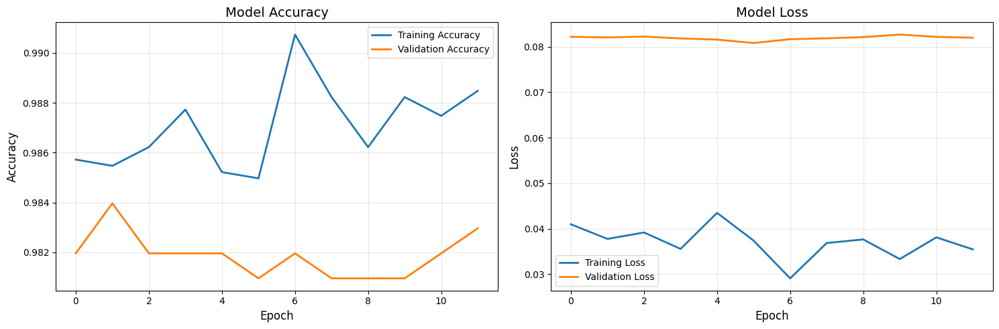

In [15]:

# MINI1

import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2S.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=7, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=50,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2S/keras_EfficientNetV2B0_mini1.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_mini_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 1024)           │     1,311,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 8)              │         4,104 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,771,224 (29.64 MB)

 Trainable params: 1,846,280 (7.04 MB)

 Non-trainable params: 5,924,944 (22.60 MB)

Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.7692 - loss: 0.8076
Epoch 1: val_accuracy improved from None to 0.94990, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.8442 - loss: 0.5337 - val_accuracy: 0.9499 - val_loss: 0.1451 - learning_rate: 0.0010
Epoch 2/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9033 - loss: 0.3466
Epoch 2: val_accuracy improved from 0.94990 to 0.95591, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.9026 - loss: 0.3347 - val_accuracy: 0.9559 - val_loss: 0.1425 - learning_rate: 0.0010
Epoch 3/30
135/250 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.9135 - loss: 0.2744
Epoch 3: val_accuracy improved from 0.95591 to 0.96794, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9168 - loss:

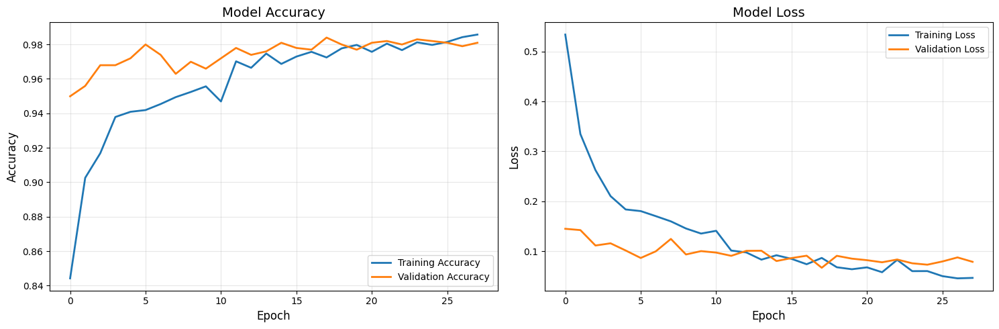

In [22]:
# MINI2

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

# 4. Классификатор (ваш лучший вариант)
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)

x = layers.Dense(1024, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)

x = layers.Dense(512, activation='relu')(x) 
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)                     # Минимальная регуляризация перед выходом


# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=30,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_mini2_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,641,880 (25.34 MB)

 Trainable params: 722,568 (2.76 MB)

 Non-trainable params: 5,919,312 (22.58 MB)

Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.6469 - loss: 1.3057
Epoch 1: val_accuracy improved from None to 0.93587, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - accuracy: 0.7583 - loss: 0.9763 - val_accuracy: 0.9359 - val_loss: 0.4379 - learning_rate: 0.0010
Epoch 2/30
248/250 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8849 - loss: 0.6274
Epoch 2: val_accuracy improved from 0.93587 to 0.95591, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.8768 - loss: 0.6149 - val_accuracy: 0.9559 - val_loss: 0.3704 - learning_rate: 0.0010
Epoch 3/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8964 - loss: 0.5455
Epoch 3: val_accuracy improved from 0.95591 to 0.96794, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.9016 - loss

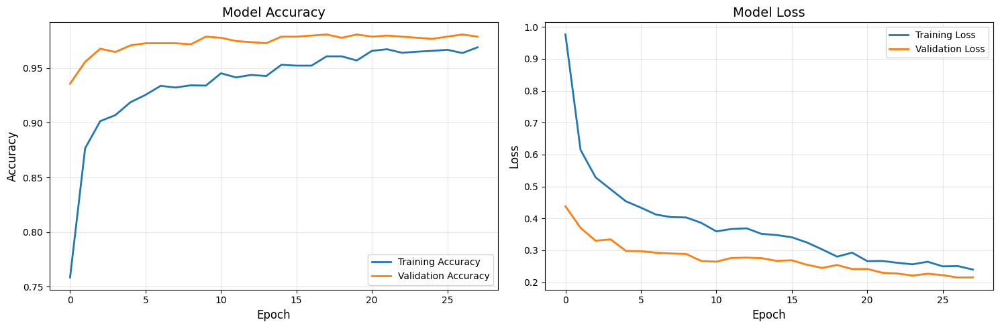

In [26]:
# MINI3

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0

from tensorflow.keras import layers, Model
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Concatenate, Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras.regularizers import l1, l2, l1_l2

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

# 4. Классификатор (ваш лучший вариант)
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = Dropout(0.7)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x) 
x = Dropout(0.4)(x)


# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=30,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_mini3_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1024)           │     1,311,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 768)            │       787,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 768)            │         3,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 512)            │       393,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,559,704 (32.65 MB)

 Trainable params: 2,633,224 (10.04 MB)

 Non-trainable params: 5,926,480 (22.61 MB)

Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.7198 - loss: 0.9022
Epoch 1: val_accuracy improved from None to 0.94589, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step - accuracy: 0.7991 - loss: 0.6735 - val_accuracy: 0.9459 - val_loss: 0.1768 - learning_rate: 0.0010
Epoch 2/30
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8789 - loss: 0.4000
Epoch 2: val_accuracy did not improve from 0.94589
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.8700 - loss: 0.4257 - val_accuracy: 0.9419 - val_loss: 0.2024 - learning_rate: 0.0010
Epoch 3/30
247/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8864 - loss: 0.3440
Epoch 3: val_accuracy improved from 0.94589 to 0.96693, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.8883 - loss: 0.3454 - val_accuracy: 0.9669 - val_loss: 0.1075 - learning_rate: 0.0010
Epoc

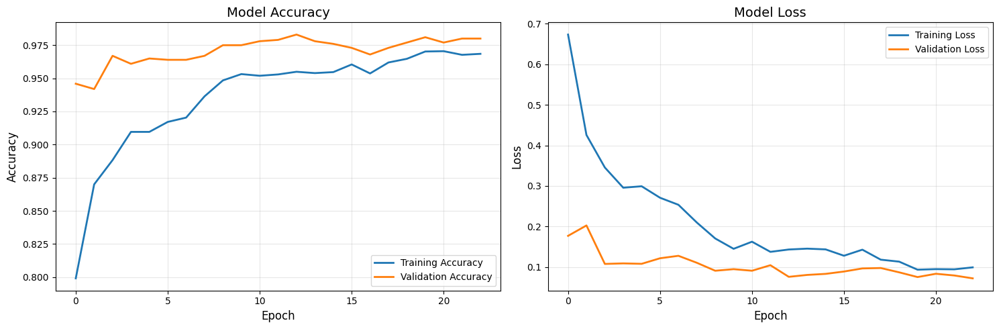

In [23]:
# MIDDLE

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

x = layers.GlobalAveragePooling2D()(x)  # Сжатие пространственных признаков
x = layers.BatchNormalization()(x)      # Стабилизация начальных признаков

x = layers.Dense(1024, activation='relu')(x)        # Максимальная емкость для сложных паттернов
x = layers.BatchNormalization()(x)                  # Контроль распределения в высокоразмерном пространстве
x = layers.Dropout(0.4)(x)                          # Сильная регуляризация против переобучения сложных признаков

x = layers.Dense(768, activation='relu')(x)         # Плавное уменьшение размерности
x = layers.BatchNormalization()(x)                  # Стабилизация промежуточных представлений
x = layers.Dropout(0.35)(x)                         # Умеренная регуляризация

x = layers.Dense(512, activation='relu')(x)         # Компактное представление признаков
x = layers.BatchNormalization()(x)                  # Подготовка к финальной классификации
x = layers.Dropout(0.3)(x)                          # Легкая регуляризация

x = layers.Dense(256, activation='relu')(x)         # Финальная адаптация признаков
x = layers.Dropout(0.2)(x)                          # Минимальная регуляризация перед выходом


# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=30,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_middle_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_25 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_11     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_22          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_23          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,749,144 (25.75 MB)

 Trainable params: 825,480 (3.15 MB)

 Non-trainable params: 5,923,664 (22.60 MB)

Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5318 - loss: 1.6161
Epoch 1: val_accuracy improved from None to 0.94489, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 26s 57ms/step - accuracy: 0.6748 - loss: 1.1609 - val_accuracy: 0.9449 - val_loss: 0.3675 - learning_rate: 0.0010
Epoch 2/30
247/250 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8308 - loss: 0.6637
Epoch 2: val_accuracy improved from 0.94489 to 0.95792, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.8369 - loss: 0.6500 - val_accuracy: 0.9579 - val_loss: 0.2778 - learning_rate: 0.0010
Epoch 3/30
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8618 - loss: 0.6088
Epoch 3: val_accuracy improved from 0.95792 to 0.96593, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.8645 - loss

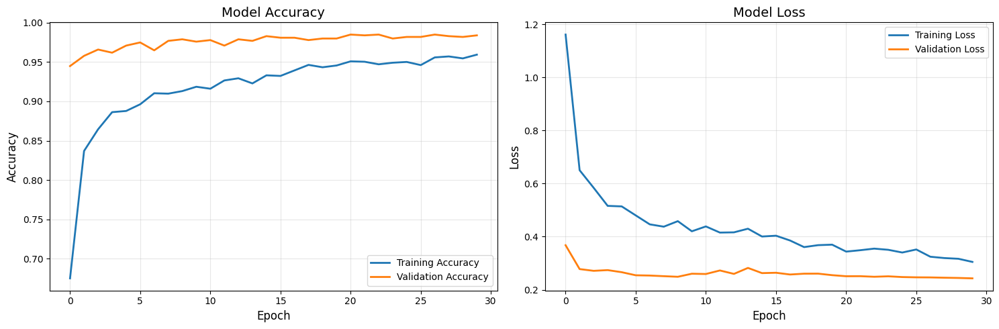

In [27]:
# MIDDLE 2

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме



# 4. Классификатор (ваш лучший вариант)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)


x = Dense(512, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = BatchNormalization()(x)
x = Dropout(0.6)(x)

x = Dense(256, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=30,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_middle2_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_29 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_13     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_29          │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,749,144 (25.75 MB)

 Trainable params: 825,480 (3.15 MB)

 Non-trainable params: 5,923,664 (22.60 MB)

Epoch 1/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.5355 - loss: 1.4958
Epoch 1: val_accuracy improved from None to 0.91483, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - accuracy: 0.6686 - loss: 1.0560 - val_accuracy: 0.9148 - val_loss: 0.3075 - learning_rate: 0.0010
Epoch 2/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8205 - loss: 0.5885
Epoch 2: val_accuracy improved from 0.91483 to 0.95691, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.8264 - loss: 0.5655 - val_accuracy: 0.9569 - val_loss: 0.1868 - learning_rate: 0.0010
Epoch 3/50
245/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8535 - loss: 0.4822
Epoch 3: val_accuracy improved from 0.95691 to 0.95892, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.8577 - loss

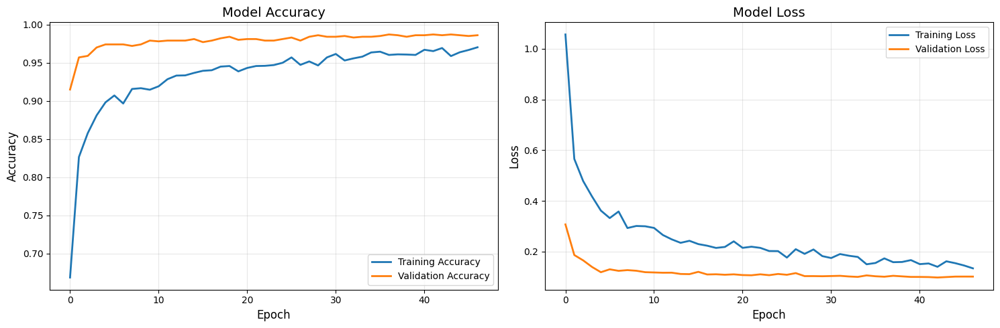

In [29]:
# MIDDLE 3

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме



# 4. Классификатор (ваш лучший вариант)
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)


x = Dense(512, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = BatchNormalization()(x)
x = Dropout(0.6)(x)

x = Dense(256, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=50,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_middle3_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetv2-b0   │ (None, 7, 7,      │  5,919,312 │ input_layer_33[0… │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1280)      │          0 │ efficientnetv2-b… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 1280)      │          0 │ efficientnetv2-b… │
│ (GlobalMaxPooling2… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 2560)      │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2560)      │     10,240 │ concatenate_1[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_48 (Dense)    │ (None, 512)       │  1,311,232 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512)       │      2,048 │ dense_48[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_35          │ (None, 512)       │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_49 (Dense)    │ (None, 256)       │    131,328 │ dropout_35[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_49[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_36          │ (None, 256)       │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_50 (Dense)    │ (None, 128)       │     32,896 │ dropout_36[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_37          │ (None, 128)       │          0 │ dense_50[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_51 (Dense)    │ (None, 8)         │      1,032 │ dropout_37[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 7,409,112 (28.26 MB)

 Trainable params: 1,483,144 (5.66 MB)

 Non-trainable params: 5,925,968 (22.61 MB)

Epoch 1/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.6581 - loss: 1.1179
Epoch 1: val_accuracy improved from None to 0.92886, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.7427 - loss: 0.8314 - val_accuracy: 0.9289 - val_loss: 0.2259 - learning_rate: 0.0010
Epoch 2/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8389 - loss: 0.5072
Epoch 2: val_accuracy improved from 0.92886 to 0.95491, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - accuracy: 0.8459 - loss: 0.4826 - val_accuracy: 0.9549 - val_loss: 0.1699 - learning_rate: 0.0010
Epoch 3/50
246/250 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.8694 - loss: 0.4300
Epoch 3: val_accuracy improved from 0.95491 to 0.96293, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.8730 - loss

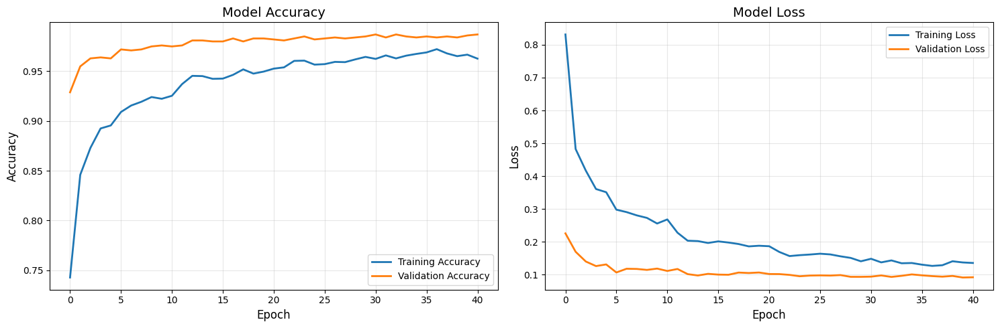

In [31]:

# MIDDLE 4

# Комбинированный Pooling

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

# 4. Классификатор (ваш лучший вариант)
gap = GlobalAveragePooling2D()(x)
gmp = GlobalMaxPooling2D()(x)
x = Concatenate()([gap, gmp])  # Удваиваем features
x = BatchNormalization()(x)


x = Dense(512, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = BatchNormalization()(x)
x = Dropout(0.6)(x)

x = Dense(256, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)

# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=50,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_middle4_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




📏 РАЗМЕРНОСТИ ВЫХОДОВ СЛОЕВ:
input_layer_63                 -> (None, 224, 224, 3)
efficientnetv2-b0              -> (None, 7, 7, 1280)
global_average_pooling2d_30    -> (None, 1280)
global_max_pooling2d_15        -> (None, 1280)
concatenate_15                 -> (None, 2560)
batch_normalization_79         -> (None, 2560)
dense_105                      -> (None, 512)
batch_normalization_80         -> (None, 512)
activation_12                  -> (None, 512)
dense_106                      -> (None, 512)
dropout_70                     -> (None, 512)
add_17                         -> (None, 512)
dense_107                      -> (None, 256)
batch_normalization_81         -> (None, 256)
activation_13                  -> (None, 256)
dense_108                      -> (None, 256)
dropout_71                     -> (None, 256)
add_18                         -> (None, 256)
dense_109                      -> (None, 128)
batch_normalization_82         -> (None, 128)
activation_14                  -

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_63      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ efficientnetv2-b0   │ (None, 7, 7,      │  5,919,312 │ input_layer_63[0… │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1280)      │          0 │ efficientnetv2-b… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 1280)      │          0 │ efficientnetv2-b… │
│ (GlobalMaxPooling2… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_15      │ (None, 2560)      │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2560)      │     10,240 │ concatenate_15[0… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_105 (Dense)   │ (None, 512)       │  1,311,232 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512)       │      2,048 │ dense_105[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, 512)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_106 (Dense)   │ (None, 512)       │  1,311,232 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_70          │ (None, 512)       │          0 │ activation_12[0]… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_17 (Add)        │ (None, 512)       │          0 │ dense_106[0][0],  │
│                     │                   │            │ dropout_70[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_107 (Dense)   │ (None, 256)       │    131,328 │ add_17[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_107[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_13       │ (None, 256)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_108 (Dense)   │ (None, 256)       │    131,328 │ add_17[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_71          │ (None, 256)       │          0 │ activation_13[0]… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_18 (Add)        │ (None, 256)       │          0 │ dense_108[0][0],  │
│                     │                   │            │ dropout_71[0][0]

 Total params: 8,885,080 (33.89 MB)

 Trainable params: 2,958,856 (11.29 MB)

 Non-trainable params: 5,926,224 (22.61 MB)

Epoch 1/70
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.7952 - loss: 2.1971
Epoch 1: val_accuracy improved from None to 0.90281, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8407 - loss: 1.6429 - val_accuracy: 0.9028 - val_loss: 0.6231 - learning_rate: 0.0010
Epoch 2/70
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8844 - loss: 0.8154
Epoch 2: val_accuracy improved from 0.90281 to 0.94890, saving model to ./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.8878 - loss: 0.7748 - val_accuracy: 0.9489 - val_loss: 0.2787 - learning_rate: 0.0010
Epoch 3/70
248/250 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9013 - loss: 0.6281
Epoch 3: val_accuracy did not improve from 0.94890
250/250 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.8988 - loss: 0.6768 - val_accuracy: 0.9309 - val_loss: 0.3870 - learning_rate: 0.0010
Epoc

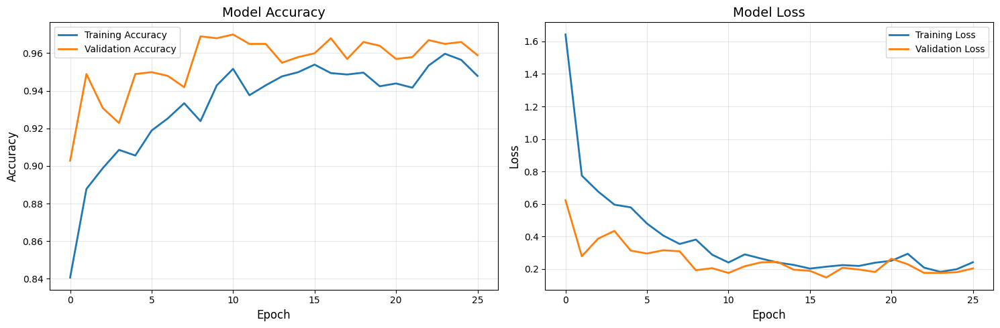

In [46]:

# MIDDLE 5

# Комбинированный Pooling + Residual connection

# Создание модели
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0, EfficientNetV2B0, EfficientNetV2S
from tensorflow.keras import layers, Model

height, width = 224, 224
#num_classes = 8  # ⬅️ ДОБАВЬТЕ ЭТУ СТРОКУ!

# 1. Сначала создаем inputs
inputs = tf.keras.Input(shape=(height, width, 3))  # ⬅️ ПЕРВЫМ ДЕЛОМ!

# 2. Базовая модель
base_model = EfficientNetV2B0(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3)  # ⬅️ ИСПРАВЛЕНО: передаем кортеж, не переменную inputs
)
base_model.trainable = False # ✅ Замораживаем веса

# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

# 4. Классификатор (ваш лучший вариант)
gap = GlobalAveragePooling2D()(x)
gmp = GlobalMaxPooling2D()(x)
x = Concatenate()([gap, gmp])  # Удваиваем features
x = BatchNormalization()(x)

# Используйте готовую функцию чтобы не думать о проекции
def residual_block(x, units, dropout_rate=0.5, l2_reg=1e-5):
    identity = x
    x = Dense(units, kernel_regularizer=l2(l2_reg))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout_rate)(x)
    
    if identity.shape[-1] != units:
        identity = Dense(units, kernel_regularizer=l2(l2_reg))(identity)
    
    return layers.Add()([identity, x])

# Residual блоки вместо обычных
x = residual_block(x, 512, dropout_rate=0.6, l2_reg=1e-5)
x = residual_block(x, 256, dropout_rate=0.5, l2_reg=1e-5) 
x = residual_block(x, 128, dropout_rate=0.4, l2_reg=1e-5)

# Финальный слой
outputs = Dense(num_classes, activation='softmax')(x)

# Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)

'''
x = Dense(512, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = BatchNormalization()(x)
x = Dropout(0.6)(x)

x = Dense(256, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)

# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)
# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)
'''
'''
# 3. Functional API с training=False
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме

# 4. Классификатор (ваш лучший вариант)
gap = GlobalAveragePooling2D()(x)
gmp = GlobalMaxPooling2D()(x)
x = Concatenate()([gap, gmp])  # Удваиваем features
x = BatchNormalization()(x)


x1 = Dense(512, activation='relu', kernel_regularizer=l2(0.00001))(x)
x1 = BatchNormalization()(x1)
x1 = Dropout(0.6)(x1)
x = layers.Add()([x, x1])  # Residual connection

x2 = Dense(256, activation='relu', kernel_regularizer=l2(0.00001))(x)
x2 = BatchNormalization()(x2)
x2 = Dropout(0.5)(x2)
x = layers.Add()([x, x2])  # Residual connection

x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)

# 5. Выходной слой
outputs = layers.Dense(num_classes, activation='softmax')(x)

# 6. Сборка и компиляция
model = Model(inputs, outputs)
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # ✅ Для integer labels
    metrics=['accuracy']
)
'''


# Просто вызовите это после создания модели:
print("📏 РАЗМЕРНОСТИ ВЫХОДОВ СЛОЕВ:")
for layer in model.layers:
    if hasattr(layer, 'output'):
        print(f"{layer.name:30} -> {layer.output.shape}")



print("✅ Модель создана для {} классов!".format(num_classes))
print("✅ Transfer Learning модель готова!")
print("🎯 EfficientNetB0 заморожена, обучаться будут только добавленные Dense слои")
model.summary()


import datetime
import os
import time
# ДОБАВЬТЕ ЭТО В САМОЕ НАЧАЛО СКРИПТА
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # 0=все, 1=INFO, 2=WARNING, 3=ERROR
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 2. Создаем callback
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=7, factor=0.5, verbose=1),
    #tensorboard_callback
]

start_time = time.time()
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=50,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)
# ВРЕМЯ
end_time = time.time()
training_time_seconds = end_time - start_time
hours = int(training_time_seconds // 3600)
minutes = int((training_time_seconds % 3600) // 60)
seconds = int(training_time_seconds % 60)
print(f"⏰ Время обучения: {hours:02d}:{minutes:02d}:{seconds:02d} (ч:м:с)")

# Оценка на валидационном датасете

best_model = tf.keras.models.load_model('./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0.keras')
print("\n📊 ОЦЕНКА МОДЕЛИ НА ВАЛИДАЦИОННЫХ ДАННЫХ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results

#print(f"✅ Финальная точность на валидации: {val_accuracy:.4f} ({val_accuracy*100:.2f}%)")
#print(f"✅ Финальные потери на валидации: {val_loss:.4f}")

# Сохранение с точностью в названии
accuracy_percent = val_accuracy * 100
save_path = f'./keras_lab/EfficientNetV2B0/keras_EfficientNetV2B0_middle5_{accuracy_percent:.2f}.keras'

best_model.save(save_path)
print(f"💾 Модель сохранена как: {save_path}")

# Визуализация результатов
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)




In [30]:
# Создание модели

import tensorflow as tf
from tensorflow.keras.applications import ResNet50, EfficientNetB0
from tensorflow.keras import layers, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Concatenate, Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras.regularizers import l1, l2, l1_l2

# Удаляем старую модель
#del model
#inputs = tf.keras.Input(shape=(224, 224, 3), name='input_3channels')
height, width = 224, 224

inputs = tf.keras.Input(shape=(height, width, 3))  # ✅ Передается кортеж с размерами

# 1. Базовая модель
base_model = EfficientNetB0(
    weights='imagenet',      # ✅ Предобученные веса
    #weights=None,  # ⬅️ Сначала без весов
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=inputs   # ✅ Ваш размер изображений <-
)
base_model.trainable = False # ✅ Замораживаем веса ResNet

# 2. Functional API с training=False


# ↓↓↓ ВСТАВЬТЕ PREPROCESS_INPUT ЗДЕСЬ ↓↓↓
# x = tf.keras.layers.Lambda(preprocess_input)(inputs)  # ← ВОТ ТУТ!
# ↑↑↑ ВСТАВЬТЕ PREPROCESS_INPUT ЗДЕСЬ ↑↑↑
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме


'''
# 98.096
# Плато после 35
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.3)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''
'''
# 97.495
# Плато после 19
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.5)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''

'''
# 97.796
# Плато после 35
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.7)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''
'''
''
# 94.389
# Плато после 34
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.7)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.4)(x)
'''

'''
# 97.796
# Плато после 20
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(256, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.3)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''



# # 3. Классификатор
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(256, activation='relu')(x)
# x = layers.Dropout(0.5)(x)      # ↑ Увеличили
# x = layers.Dense(128, activation='relu')(x) 
# x = layers.Dropout(0.3)(x)      # ↑ Увеличили

# Хорошо
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(256, activation='relu')(x)
# x = layers.Dropout(0.6)(x)      # ↑ Было 0.5 → Стало 0.6
# x = layers.Dense(128, activation='relu')(x) 
# x = layers.Dropout(0.4)(x)      # ↑ Было 0.3 → Стало 0.4

# норм
#from tensorflow.keras.regularizers import l2
#from tensorflow.keras.layers import Dense, Dropout

'''
# 97.495
# после 12 плато
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.7)(x)
x = Dense(64, activation='relu', kernel_regularizer=l2(0.001))(x) 
x = Dropout(0.3)(x)
'''


'''
# 97.49
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = Dropout(0.7)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x) 
x = Dropout(0.4)(x)
'''



# 98.397
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)  # ⬅️ Добавляем BatchNorm
x = layers.Dense(1024, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x) 
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)


'''
# 97.996
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)  # ⬅️ Добавляем BatchNorm
x = layers.Dense(512, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.7)(x)
x = layers.Dense(128, activation='relu')(x) 
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
'''

# Хорошо v2 (лучше)
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(512, activation='relu')(x)  # ↑ Увеличить capacity
# x = layers.Dropout(0.7)(x)                   # ↑ Сильная регуляризация
# x = layers.Dense(64, activation='relu')(x)   # ↓ Уменьшить второй слой
# x = layers.Dropout(0.3)(x)

# # хуже хорошего
# x = GlobalMaxPooling2D()(x)      # Берет максимум вместо среднего
# x = layers.Dense(128, activation='relu')(x)  # ↑ Увеличить capacity
# x = layers.Dropout(0.7)(x)                   # ↑ Сильная регуляризация
# x = layers.Dense(64, activation='relu')(x)   # ↓ Уменьшить второй слой
# x = layers.Dropout(0.3)(x)

# # Попробуйте:
# x = GlobalMaxPooling2D()(x)      # Берет максимум вместо среднего
# x = layers.Dense(512, activation='relu')(x)  # ↑ Увеличить capacity
# x = layers.Dropout(0.7)(x)                   # ↑ Сильная регуляризация
# x = layers.Dense(64, activation='relu')(x)   # ↓ Уменьшить второй слой
# x = layers.Dropout(0.3)(x)

# 3. Классификатор
# x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
# x = layers.Dense(256, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
# x = layers.Dropout(0.3)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
# x = layers.Dense(128, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
# x = layers.Dropout(0.2)(x)                 # Постепенное уменьшение регуляризации к выходу"

# Выходной слой для 2 классов
#outputs = layers.Dense(2, activation='softmax')(x)  # ✅ 2 класса
# ВАЖНО: выходной слой с num_classes нейронами!
outputs = layers.Dense(num_classes, activation='softmax')(x)  # ← АВТОМАТИЧЕСКИ!

# 4. Сборка и компиляция
model = Model(inputs, outputs) # <-
model.compile(
    optimizer='adam',
    #loss='categorical_crossentropy',  # ✅ Для categorical меток
    loss='sparse_categorical_crossentropy',  # ← ДЛЯ INTEGER LABELS
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
#model.summary()
print("✅ Transfer Learning модель готова!")
print("🎯 ResNet50 заморожена, обучаться будут только добавленные Dense слои")
model.summary()

TypeError: A symbolic KerasTensor cannot be used as a boolean.

In [75]:
# Полный код для вашего случая
import datetime
import os

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

#from datetime import datetime

#from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau  # ← ДОБАВЬ ЭТО

# 1. Создаем папку для логов
log_dir = os.path.join("logs", "fit", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
os.makedirs(log_dir, exist_ok=True)

# 2. Создаем callback
tensorboard_callback = TensorBoard(
    log_dir=log_dir,
    #histogram_freq=1,
    histogram_freq=0,      # ⬅️ Без гистограмм
    #write_graph=True,
    write_graph=False,     # ⬅️ Без графа модели (экономит память)
    write_images=False,  # Можно отключить для экономии места
    profile_batch=0,        # ⬅️ Без профилирования
    update_freq='epoch'
)

# 3. Добавляем в обучение
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('best_model_keras.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

print(f"📊 TensorBoard логи будут сохранены в: {log_dir}")

📊 TensorBoard логи будут сохранены в: logs/fit/20251020-112733


In [76]:
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=50,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)

# 5. После обучения запускаем TensorBoard
print("\n🎯 Для просмотра TensorBoard выполните:")
print("!tensorboard --logdir logs/fit")
print("И откройте http://localhost:6006/")

Epoch 1/50
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.7898 - loss: 0.7053
Epoch 1: val_accuracy improved from None to 0.94890, saving model to best_model_keras.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 15s 44ms/step - accuracy: 0.8492 - loss: 0.5068 - val_accuracy: 0.9489 - val_loss: 0.1629 - learning_rate: 0.0010
Epoch 2/50
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9115 - loss: 0.2926
Epoch 2: val_accuracy improved from 0.94890 to 0.96994, saving model to best_model_keras.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - accuracy: 0.9093 - loss: 0.2981 - val_accuracy: 0.9699 - val_loss: 0.1250 - learning_rate: 0.0010
Epoch 3/50
247/250 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9154 - loss: 0.2597
Epoch 3: val_accuracy did not improve from 0.96994
250/250 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - accuracy: 0.9226 - loss: 0.2373 - val_accuracy: 0.9599 - val_loss: 0.1290 - learning_rate: 0.0010
Epoch 4/50
247/250 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9333 - 

In [29]:
!tensorboard --logdir logs/fit

/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.20.0 at http://localhost:6006/ (Press CTRL+C to quit)
^C


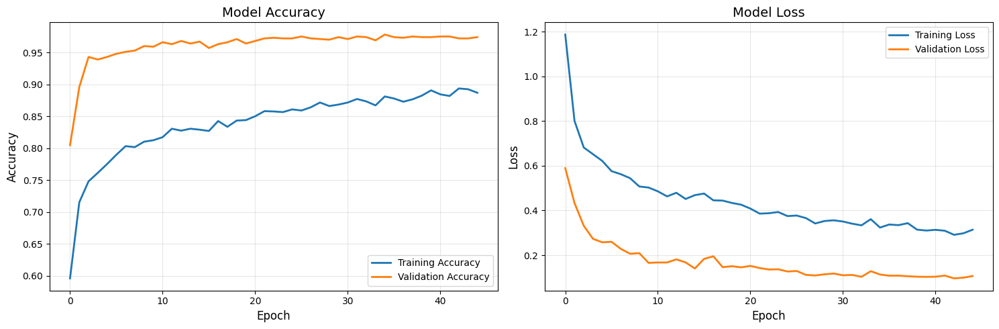

In [70]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)

🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...
📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
📦 Обработано батчей: 40
📦 Обработано батчей: 50
📦 Обработано батчей: 60
✅ Собрано 998 предсказаний
🔢 Уникальные истинные классы: [0 1 2 3 4 5 6 7]
🔢 Уникальные предсказанные классы: [0 1 2 3 4 5 6 7]
📋 Присутствующие классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
📏 Confusion matrix shape: (8, 8)


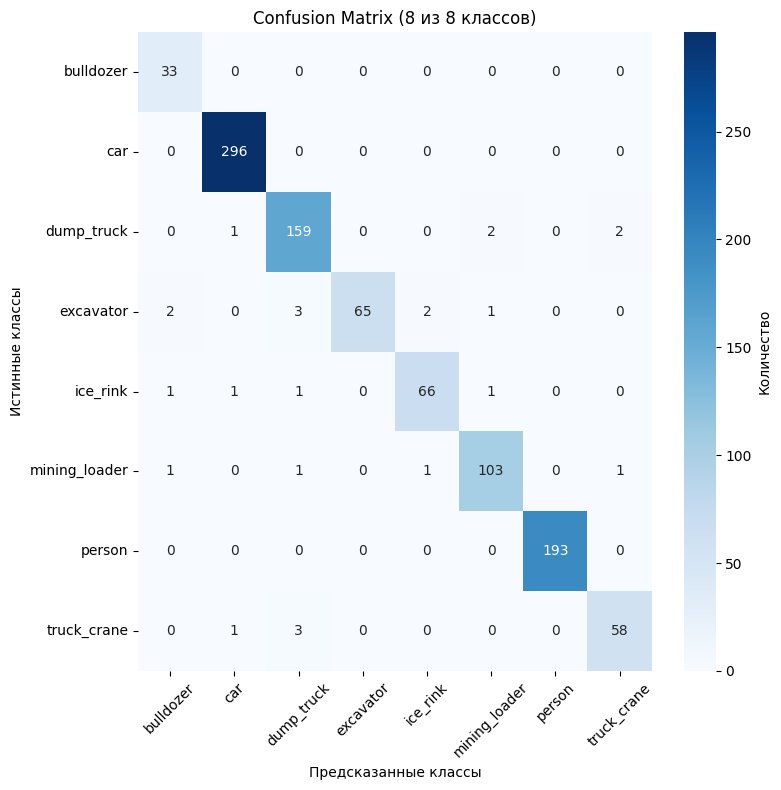


📈 ДЕТАЛЬНАЯ СТАТИСТИКА:
Всего примеров: 998
Общая точность: 0.9749

🎯 ТОЧНОСТЬ ПО КЛАССАМ:
  bulldozer: 1.0000 (33/33)
  car: 1.0000 (296/296)
  dump_truck: 0.9695 (159/164)
  excavator: 0.8904 (65/73)
  ice_rink: 0.9429 (66/70)
  mining_loader: 0.9626 (103/107)
  person: 1.0000 (193/193)
  truck_crane: 0.9355 (58/62)

📊 CLASSIFICATION REPORT:
               precision    recall  f1-score   support

    bulldozer     0.8919    1.0000    0.9429        33
          car     0.9900    1.0000    0.9950       296
   dump_truck     0.9521    0.9695    0.9607       164
    excavator     1.0000    0.8904    0.9420        73
     ice_rink     0.9565    0.9429    0.9496        70
mining_loader     0.9626    0.9626    0.9626       107
       person     1.0000    1.0000    1.0000       193
  truck_crane     0.9508    0.9355    0.9431        62

     accuracy                         0.9749       998
    macro avg     0.9630    0.9626    0.9620       998
 weighted avg     0.9755    0.9749    0.9748  

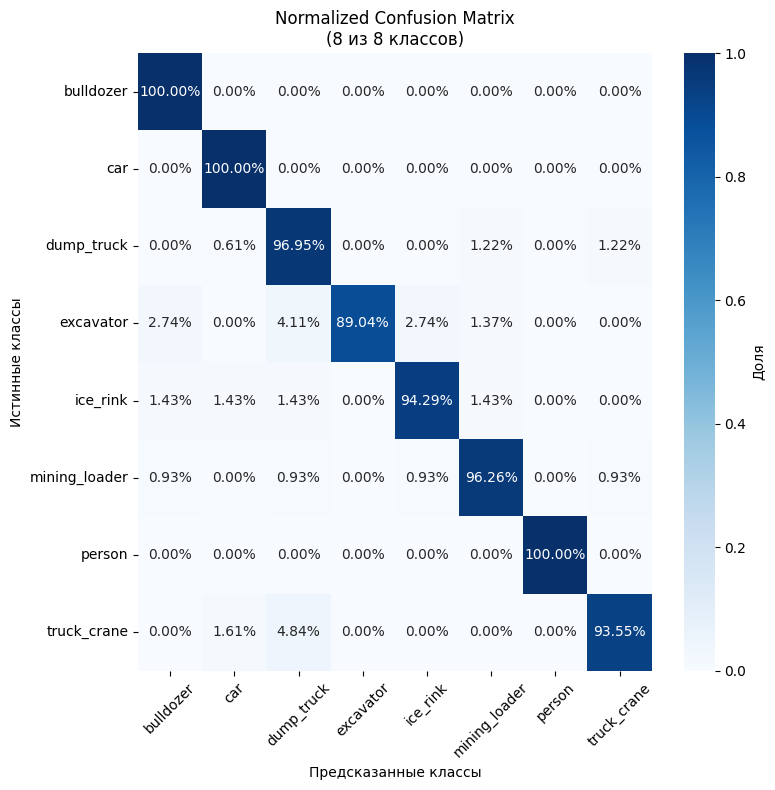

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(model, validation_data, class_names)

🎲 Тестирование случайных примеров...


2025-10-20 10:16:44.717970: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1681', 12 bytes spill stores, 12 bytes spill loads

2025-10-20 10:16:44.850847: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1681', 104 bytes spill stores, 104 bytes spill loads

2025-10-20 10:16:44.964254: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1688', 64 bytes spill stores, 64 bytes spill loads

2025-10-20 10:16:45.030210: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1681', 4028 bytes spill stores, 4008 bytes spill loads

2025-10-20 10:16:45.185778: I exte

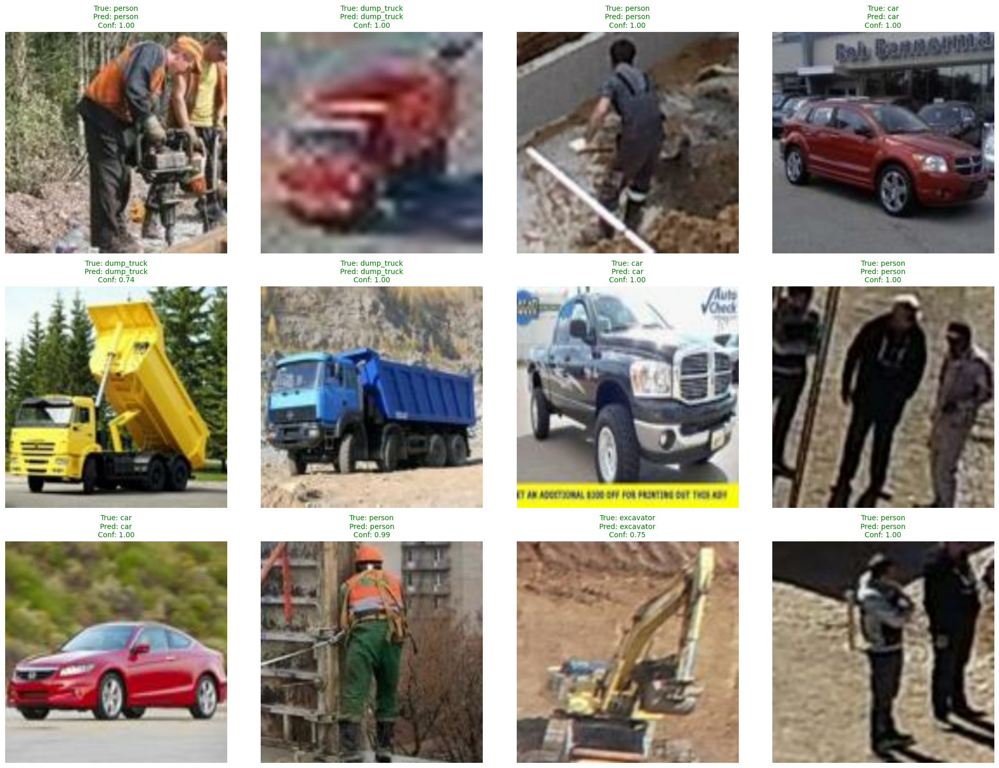

📊 Точность на 12 случайных примерах: 12/12 (100.0%)


In [34]:
# рандом ВЕРСИЯ ДЛЯ SPARSE LABELS 

def test_random_predictions_modern(model, dataset, class_names, num_samples=12):
    """
    Тестирование случайных примеров из всего датасета
    ВЕРСИЯ ДЛЯ SPARSE LABELS (целочисленные метки)
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # ДЛЯ SPARSE LABELS - просто используем как есть, без argmax!
    true_classes = selected_labels  # ← ИСПРАВЛЕНИЕ ЗДЕСЬ
    
    # Создаем сетку
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif rows > 1 and cols == 1:
        axes = axes.reshape(-1, 1)
    
    correct = 0
    for i, idx in enumerate(indices):
        if rows == 1:
            ax = axes[col] if cols > 1 else axes
        else:
            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]
        
        # Денормализация для ResNet50
        image = selected_images[i].copy()
        image[..., 0] += 103.939
        image[..., 1] += 116.779  
        image[..., 2] += 123.68
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        if rows == 1:
            if cols > 1:
                axes[i].axis('off')
        else:
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    
    return correct, accuracy

# Использование случайных примеров:
print("🎲 Тестирование случайных примеров...")
correct, accuracy = test_random_predictions_modern(model, validation_data, class_names, num_samples=12)

🎲 Тестирование случайных примеров (универсальная версия)...


2025-10-20 10:16:53.835506: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1688', 488 bytes spill stores, 488 bytes spill loads

2025-10-20 10:16:53.846289: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1688', 4 bytes spill stores, 4 bytes spill loads

2025-10-20 10:16:54.089488: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1688_0', 36 bytes spill stores, 36 bytes spill loads



🔍 Обнаружен формат меток: SPARSE


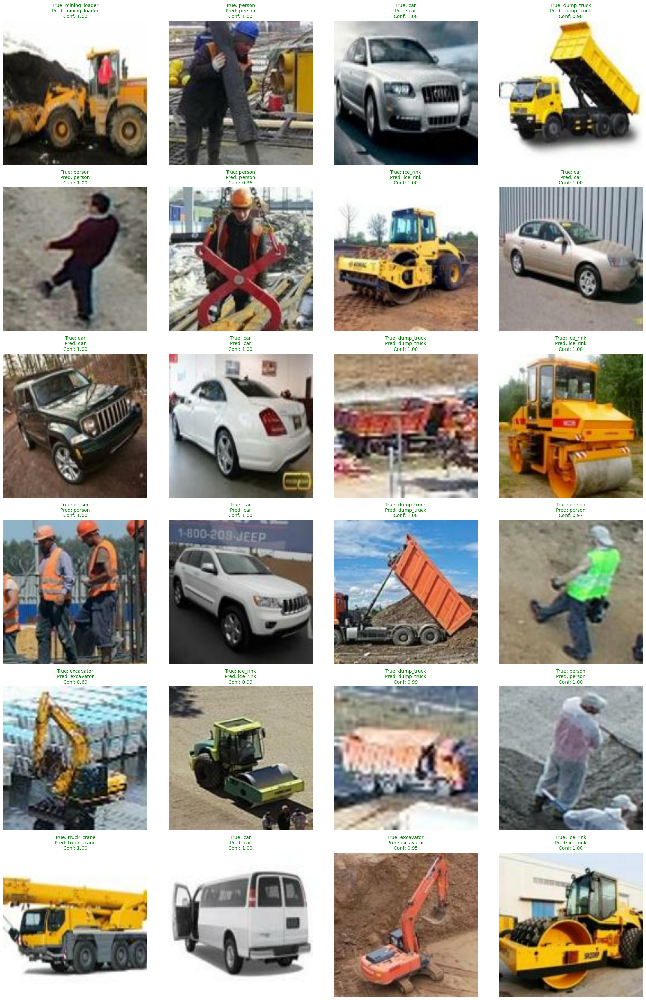

📊 Точность на 24 случайных примерах: 24/24 (100.0%)
🎯 Формат меток: SPARSE


In [35]:
# рандом УНИВЕРСАЛЬНАЯ ВЕРСИЯ (работает с любым форматом)

def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная версия для любого формата меток
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # АВТОМАТИЧЕСКОЕ ОПРЕДЕЛЕНИЕ ФОРМАТА МЕТОК
    if len(selected_labels.shape) == 1:  # SPARSE labels
        true_classes = selected_labels
        label_format = "SPARSE"
    else:  # ONE-HOT labels
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем сетку
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct = 0
    for i, idx in enumerate(indices):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        
        # Умная денормализация
        image = selected_images[i].copy()
        
        # Автоматическое определение диапазона
        if image.min() >= -1 and image.max() <= 1:
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            image = image * 255
        else:
            # ImageNet нормализация
            image[..., 0] += 103.939
            image[..., 1] += 116.779  
            image[..., 2] += 123.68
        
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        row = i // cols
        col = i % cols
        if rows > 1:
            axes[row, col].axis('off')
        else:
            axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    print(f"🎯 Формат меток: {label_format}")
    
    return correct, accuracy

# Тестируем универсальную версию
print("🎲 Тестирование случайных примеров (универсальная версия)...")
correct, accuracy = test_random_predictions_universal(model, validation_data, class_names, num_samples=24)

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [ ]:
# Сохраняем в современном формате
model.save('best_model_1.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")